# step1: Read Data

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression as LR
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from keras.layers.core import Activation, Dense
from keras.layers import Dropout
from keras.models import Sequential
from sklearn.model_selection import GridSearchCV 
from sklearn.metrics import accuracy_score,roc_auc_score,recall_score,precision_score,balanced_accuracy_score,auc
from sklearn.metrics import confusion_matrix,classification_report,roc_curve
from sklearn.externals import joblib
import eli5
from eli5.sklearn import PermutationImportance
import shap

import warnings
warnings.filterwarnings("ignore")

inputfile = './data_processed/final_end.xlsx'
data = pd.read_excel(inputfile)
data = data[data.columns[1:]]
data.head()

d:\python3.6.0\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
d:\python3.6.0\lib\site-packages\tensorflow\python\framework\dtypes.py:493: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
d:\python3.6.0\lib\site-packages\tensorflow\python\framework\dtypes.py:494: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
d:\python3.6.0\lib\site-packages\tensorflow\python\framework\dtypes.py:495: FutureWarning: Passing (t

,age,gender_0,gender_1,temperature_max,temperature_min,temperature_median,temperature_mean,temperature_std,heart_rate_max,heart_rate_min,...,TBT,TBTR,Fibrinogen,FDP,FEU,Myoglobin,MCKMB,UNP,Troponin,labels
0,0.741573,0,1,0.342105,0.3625,0.307692,0.241579,0.175415,0.086814,0.206186,...,0.183879,0.004421,0.084364,0.100927,0.039314,0.138615,0.002246,1.000000,0.015441,1
1,0.966292,1,0,0.328947,0.2500,0.292308,0.237498,0.283707,0.069615,0.257732,...,0.138539,0.001651,0.093926,0.060856,0.044063,0.004830,0.000373,0.095357,0.001630,1
2,0.764045,0,1,0.302632,0.3750,0.400000,0.276065,0.217434,0.081900,0.262887,...,0.141898,0.001861,0.110096,0.032056,0.016095,0.006645,0.000349,0.039554,0.003666,1
3,0.561798,1,0,0.236842,0.4000,0.307692,0.248470,0.073719,0.061425,0.288660,...,0.153233,0.002532,0.031637,0.053343,0.005673,0.153464,0.005685,0.197825,0.013373,1
4,0.707865,0,1,0.263158,0.4250,0.384615,0.274544,0.122426,0.098280,0.335052,...,0.133501,0.001315,0.184336,0.376409,0.080871,0.023763,0.000206,0.018510,0.001345,1


In [2]:
data.shape

(728, 102)

In [3]:
# 划分数据集
X = data.iloc[:, 0:101]
y = data.iloc[:, 101]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

X_train.shape, X_test.shape

((582, 101), (146, 101))

In [4]:
y_test.value_counts()

1    103
0     43
Name: labels, dtype: int64

# step2: Correlation analysis

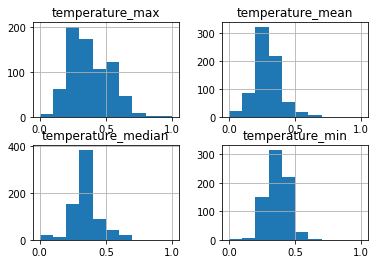

In [5]:
# 绘制各维特征的分布直方图
data[data.columns[3:7]].hist()
plt.show()

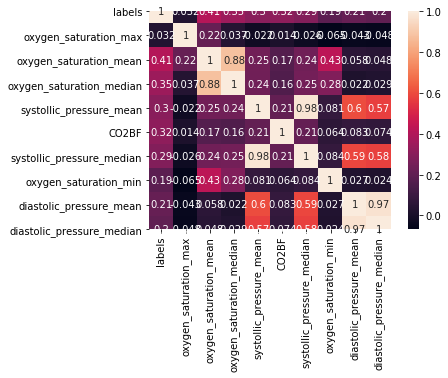

In [6]:
# 热力图--多个特征两两相似度
# Spearman相关系数(秩相关系数): 利用两变量的秩次大小作线性相关分析，对原始变量的分布不作要求，属于非参数统计方法，适用范围广。
corr_mat = data.corr(method='spearman')
#f, ax = plt.subplots(figsize=(12, 9))
#sns.heatmap(corr_mat, vmax=.8, square=True, ax=ax)
#plt.show()

k = 10
cols = corr_mat.nlargest(k, 'labels')['labels'].index
cm = np.corrcoef(data[cols].values.T)
sns.heatmap(cm, annot=True, square=True, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [7]:
data[cols].columns

Index(['labels', 'oxygen_saturation_max', 'oxygen_saturation_mean',
       'oxygen_saturation_median', 'systollic_pressure_mean', 'CO2BF',
       'systollic_pressure_median', 'oxygen_saturation_min',
       'diastolic_pressure_mean', 'diastolic_pressure_median'],
      dtype='object')

In [8]:
corr_mat['labels']

age               -0.048348
gender_0           0.058257
gender_1          -0.058257
temperature_max    0.211562
temperature_min   -0.098467
                     ...   
Myoglobin         -0.339154
MCKMB             -0.333759
UNP               -0.193485
Troponin          -0.268373
labels             1.000000
Name: labels, Length: 102, dtype: float64

# step3: LogisticRegression

In [9]:
lr = LR(penalty='l1', dual=False, tol=0.0001, C=1.0, fit_intercept=True, 
        intercept_scaling=1, class_weight='balanced', random_state=1, solver='liblinear', 
        max_iter=100, multi_class='ovr', verbose=0, warm_start=False, n_jobs=1)

lr.fit(X_train, y_train)

lr_y_predict = lr.predict(X_test)
lr_y_probs = lr.predict_proba(X_test) # 模型的预测得分

train_lr_y_score = lr.score(X_train, y_train)
test_lr_y_score = lr.score(X_test, y_test)
print("Accuracy of LR Classifier(Train): {score}".format(score=train_lr_y_score))
print("Accuracy of LR Classifier(Test): {score}".format(score=test_lr_y_score))

Accuracy of LR Classifier(Train): 0.8195876288659794
Accuracy of LR Classifier(Test): 0.8287671232876712


In [10]:
print("LR Classifier: ")
print("ACCURACY         : {score}".format(score=accuracy_score(y_test, lr_y_predict)))           # 准确率
print("AUC              : {score}".format(score=roc_auc_score(y_test, lr_y_probs[:, 1])))        # AUC
print("RECALL           : {score}".format(score=recall_score(y_test, lr_y_predict)))             # 召回率
print("PRECISION        : {score}".format(score=precision_score(y_test, lr_y_predict)))          # 正确率
print("BALANCED_ACCURACY: {score}".format(score=balanced_accuracy_score(y_test, lr_y_predict)))  # 平衡精度

LR Classifier: 
ACCURACY         : 0.8287671232876712
AUC              : 0.884849853240009
RECALL           : 0.8640776699029126
PRECISION        : 0.89
BALANCED_ACCURACY: 0.8041318582072703


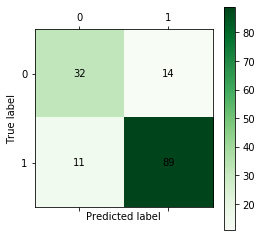

In [11]:
# 自定义混淆矩阵
def cm_plot(y_test, y_predict):
        cm = confusion_matrix(y_test, y_predict)

        plt.matshow(cm, cmap=plt.cm.Greens)
        plt.colorbar()

        for x in range(len(cm)):
            for y in range(len(cm)):
                plt.annotate(
                    cm[x, y],
                    xy=(x, y),
                    horizontalalignment='center',
                    verticalalignment='center')

        plt.ylabel('True label')
        plt.xlabel('Predicted label')
        return plt

cm_plot(y_test, lr_y_predict).show()

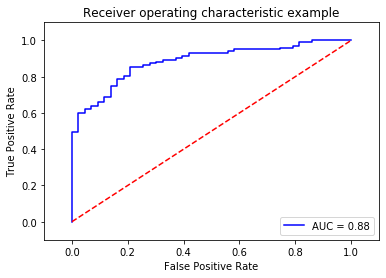

In [12]:
# ROC曲线
fpr, tpr, thresholds = roc_curve(y_test, lr_y_probs[:, 1])
roc_auc = auc(fpr, tpr)  # auc为Roc曲线下的面积

plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.xlabel('False Positive Rate') # 横坐标是fpr
plt.ylabel('True Positive Rate')  # 纵坐标是tpr
plt.title('Receiver operating characteristic example')
plt.show()

In [13]:
lr.coef_

array([[-0.24653993, -0.02472648,  0.        ,  0.        , -0.97181502,
         0.07713145,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        , -3.89199729,  0.        ,  0.40826826, -0.52715685,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.61958014,  0.        ,  0.        ,  2.11680274,
         0.        ,  0.07557324, -0.33747817,  0.        ,  0.95928286,
         0.        ,  7.62749457,  0.        ,  0.        ,  0.31268666,
         0.        ,  0.14387125,  0.        , -0.05130579,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        , -1.10982063,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        -0.10078675,  0.        ,  0.        ,  0.09243474,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.26356856,  0.        ,  0.        , -0.04119787,  0.        ,
         0.57126438,  0.        ,  0.        , -1.9

In [14]:
# 特征重要性
importances = lr.coef_[0]
feat_labels = data.columns[:-1]
indices = np.argsort(importances)[::-1]
for f in range(X_train.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30, feat_labels[indices[f]], importances[indices[f]]))

 1) oxygen_saturation_mean         7.627495
 2) diastolic_pressure_min         2.116803
 3) oxygen_saturation_min          0.959283
 4) systollic_pressure_mean        0.619580
 5) Creatinine                     0.571264
 6) cholesterol                    0.472674
 7) breath_rate_max                0.408268
 8) Hemoglobin                     0.312687
 9) ALB                            0.263569
10) SIPP                           0.243257
11) Fibrinogen                     0.154512
12) MRBC                           0.143871
13) TBB                            0.092435
14) temperature_median             0.077131
15) diastolic_pressure_mean        0.075573
16) MCPC                           0.000000
17) NNPC                           0.000000
18) ESPC                           0.000000
19) AST_ALT                        0.000000
20) NNAV                           0.000000
21) BSPC                           0.000000
22) Platelet                       0.000000
23) LPAV                        

In [15]:
# print the JS visualization code to the notebook
shap.initjs()

In [16]:
# 多个预测的解释
explainer = shap.KernelExplainer(lr.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

Using 582 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


A Jupyter Widget

In [20]:
y_base = explainer.expected_value  # shap均值
print(y_base)

[0.42592473 0.57407527]


In [40]:
lr.predict_proba(X_test)  # 0--死亡， 1--存活 

array([[0.68476578, 0.31523422],
       [0.56478374, 0.43521626],
       [0.28685241, 0.71314759],
       [0.1437513 , 0.8562487 ],
       [0.2670365 , 0.7329635 ],
       [0.06848304, 0.93151696],
       [0.60839277, 0.39160723],
       [0.1443448 , 0.8556552 ],
       [0.15354172, 0.84645828],
       [0.09693295, 0.90306705],
       [0.0658706 , 0.9341294 ],
       [0.96857598, 0.03142402],
       [0.21666367, 0.78333633],
       [0.53607076, 0.46392924],
       [0.18958048, 0.81041952],
       [0.09951016, 0.90048984],
       [0.14388336, 0.85611664],
       [0.22635532, 0.77364468],
       [0.88366381, 0.11633619],
       [0.30068149, 0.69931851],
       [0.30032027, 0.69967973],
       [0.11907187, 0.88092813],
       [0.16074518, 0.83925482],
       [0.38351095, 0.61648905],
       [0.83930653, 0.16069347],
       [0.1680142 , 0.8319858 ],
       [0.09722431, 0.90277569],
       [0.94432959, 0.05567041],
       [0.28577674, 0.71422326],
       [0.86186312, 0.13813688],
       [0.

In [46]:
pd.Series(lr_y_predict).value_counts()

1    100
0     46
dtype: int64

In [49]:
shap_values
print(shap_values[1].shape)

(146, 101)


In [44]:
# 单个预测的解释
row_to_show = 0
shap.force_plot(explainer.expected_value[1], shap_values[1][row_to_show, :], X_test.iloc[row_to_show,:])

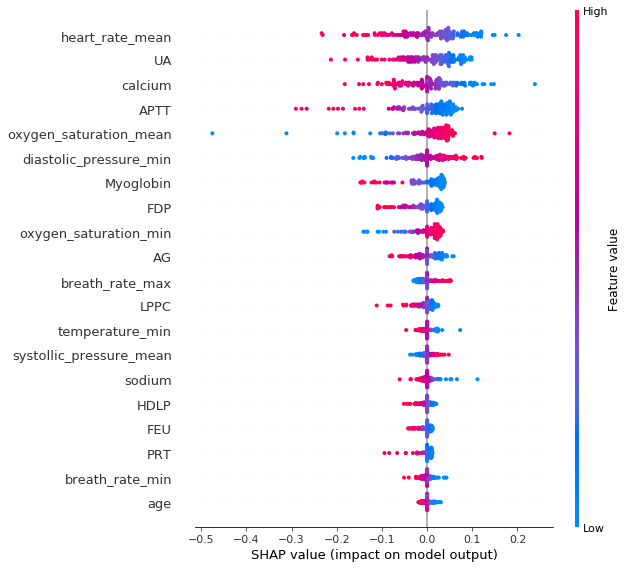

In [51]:
shap.summary_plot(shap_values[1], X_test)

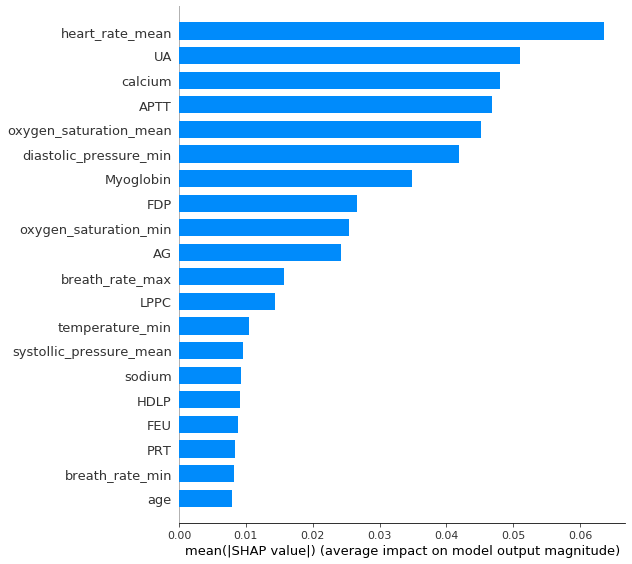

In [52]:
# summarize the effects of all the features
shap.summary_plot(shap_values[0], X_test, plot_type="bar")

In [9]:
# 保存模型
# joblib.dump(lr, './models/LR.pkl')

['./models/LR.pkl']

# step4: KNeighborsClassifier

In [13]:
knn = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=6, p=2,
                     weights='uniform')

knn.fit(X_train, y_train)

knn_y_predict = knn.predict(X_test)
knn_y_probs = knn.predict_proba(X_test) # 模型的预测得分

train_knn_y_score = knn.score(X_train, y_train)
test_knn_y_score = knn.score(X_test, y_test)
print("Accuracy of KNeighborsClassifier(Train): {score}".format(score=train_knn_y_score)) 
print("Accuracy of KNeighborsClassifier(Test): {score}".format(score=test_knn_y_score))

Accuracy of KNeighborsClassifier(Train): 0.8247422680412371
Accuracy of KNeighborsClassifier(Test): 0.7876712328767124


In [14]:
print("KNN Classifier: ")
print("ACCURACY         : {score}".format(score=accuracy_score(y_test, knn_y_predict)))           # 准确率
print("AUC              : {score}".format(score=roc_auc_score(y_test, knn_y_probs[:, 1])))        # AUC
print("RECALL           : {score}".format(score=recall_score(y_test, knn_y_predict)))             # 召回率
print("PRECISION        : {score}".format(score=precision_score(y_test, knn_y_predict)))          # 正确率
print("BALANCED_ACCURACY: {score}".format(score=balanced_accuracy_score(y_test, knn_y_predict)))  # 平衡精度

KNN Classifier: 
ACCURACY         : 0.7876712328767124
AUC              : 0.7374125084669226
RECALL           : 0.941747572815534
PRECISION        : 0.7950819672131147
BALANCED_ACCURACY: 0.6801761119891624


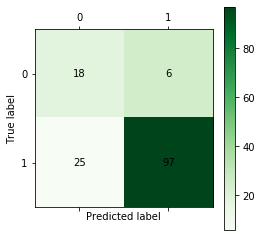

In [15]:
# 混淆矩阵
cm_plot(y_test, knn_y_predict).show()

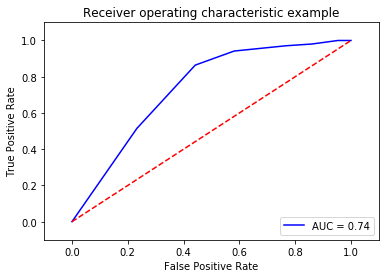

In [16]:
# ROC曲线
fpr, tpr, thresholds = roc_curve(y_test, knn_y_probs[:, 1])
roc_auc = auc(fpr, tpr)  # auc为Roc曲线下的面积

plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.xlabel('False Positive Rate') # 横坐标是fpr
plt.ylabel('True Positive Rate')  # 纵坐标是tpr
plt.title('Receiver operating characteristic example')
plt.show()

In [17]:
# 多个预测的解释
explainer = shap.KernelExplainer(knn.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

Using 582 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


A Jupyter Widget

In [18]:
y_base = explainer.expected_value  # shap均值
print(y_base)

[0.22250859 0.77749141]


In [19]:
knn.predict_proba(X_test)  # 0--死亡， 1--存活 

array([[0.        , 1.        ],
       [0.5       , 0.5       ],
       [0.33333333, 0.66666667],
       [0.        , 1.        ],
       [0.16666667, 0.83333333],
       [0.        , 1.        ],
       [0.33333333, 0.66666667],
       [0.        , 1.        ],
       [0.16666667, 0.83333333],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.83333333, 0.16666667],
       [0.        , 1.        ],
       [0.16666667, 0.83333333],
       [0.16666667, 0.83333333],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.16666667, 0.83333333],
       [0.66666667, 0.33333333],
       [0.        , 1.        ],
       [0.16666667, 0.83333333],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.16666667, 0.83333333],
       [0.83333333, 0.16666667],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.66666667, 0.33333333],
       [0.16666667, 0.83333333],
       [0.66666667, 0.33333333],
       [0.

In [20]:
pd.Series(knn_y_predict).value_counts()

1    122
0     24
dtype: int64

In [21]:
# 单个预测的解释
row_to_show = 0
shap.force_plot(explainer.expected_value[1], shap_values[1][row_to_show, :], X_test.iloc[row_to_show,:])

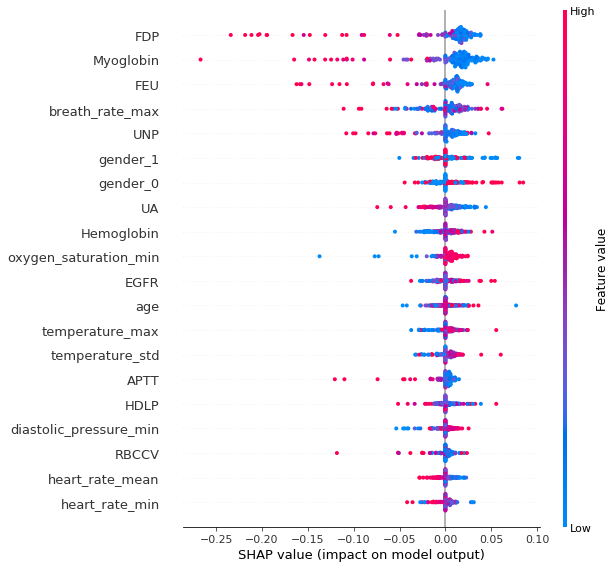

In [22]:
shap.summary_plot(shap_values[1], X_test)

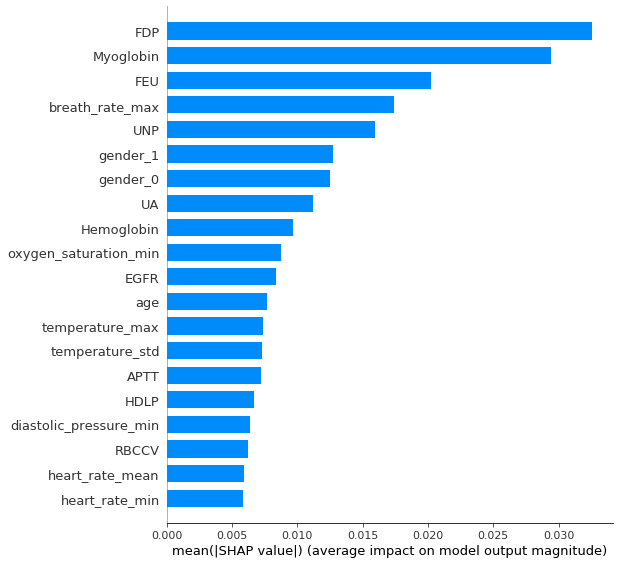

In [23]:
# summarize the effects of all the features
shap.summary_plot(shap_values[0], X_test, plot_type="bar")

In [14]:
# joblib.dump(knn, './models/KNN.pkl')

['./models/KNN.pkl']

# step5: SVC

In [24]:
svc = SVC(C=1.2, cache_size=200, class_weight=None, coef0=0.0,
        decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
        kernel='linear', max_iter=-1, probability=True, random_state=None,
        shrinking=True, tol=0.001, verbose=False)

svc.fit(X_train, y_train)

svc_y_predict = svc.predict(X_test)
svc_y_probs = svc.predict_proba(X_test) # 模型的预测得分

train_svc_y_score = svc.score(X_train, y_train)
test_svc_y_score = svc.score(X_test, y_test)
print("Accuracy of SVC Classifier(Train): {score}".format(score=train_svc_y_score))
print("Accuracy of SVC Classifier(Test): {score}".format(score=test_svc_y_score))

Accuracy of SVC Classifier(Train): 0.8591065292096219
Accuracy of SVC Classifier(Test): 0.8493150684931506


In [25]:
print("SVC Classifier: ")
print("ACCURACY         : {score}".format(score=accuracy_score(y_test, svc_y_predict)))           # 准确率
print("AUC              : {score}".format(score=roc_auc_score(y_test, svc_y_probs[:, 1])))        # AUC
print("RECALL           : {score}".format(score=recall_score(y_test, svc_y_predict)))             # 召回率
print("PRECISION        : {score}".format(score=precision_score(y_test, svc_y_predict)))          # 正确率
print("BALANCED_ACCURACY: {score}".format(score=balanced_accuracy_score(y_test, svc_y_predict)))  # 平衡精度

SVC Classifier: 
ACCURACY         : 0.8493150684931506
AUC              : 0.9008805599458117
RECALL           : 0.9514563106796117
PRECISION        : 0.8521739130434782
BALANCED_ACCURACY: 0.7780537367351547


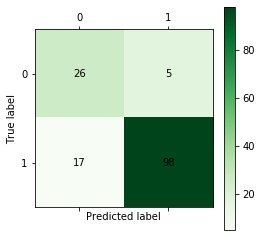

In [26]:
# 混淆矩阵
cm_plot(y_test, svc_y_predict).show()

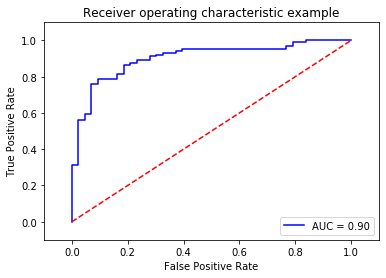

In [27]:
# ROC曲线
fpr, tpr, thresholds = roc_curve(y_test, svc_y_probs[:, 1])
roc_auc = auc(fpr, tpr)  # auc为Roc曲线下的面积

plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.xlabel('False Positive Rate') # 横坐标是fpr
plt.ylabel('True Positive Rate')  # 纵坐标是tpr
plt.title('Receiver operating characteristic example')
plt.show()

In [28]:
# 多个预测的解释
explainer = shap.KernelExplainer(svc.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

Using 582 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


A Jupyter Widget

In [29]:
y_base = explainer.expected_value  # shap均值
print(y_base)

[0.32275489 0.67724511]


In [30]:
svc.predict_proba(X_test)  # 0--死亡， 1--存活 

array([[0.54487526, 0.45512474],
       [0.47217502, 0.52782498],
       [0.21602354, 0.78397646],
       [0.09816656, 0.90183344],
       [0.19290692, 0.80709308],
       [0.03182099, 0.96817901],
       [0.51386283, 0.48613717],
       [0.10181292, 0.89818708],
       [0.03754401, 0.96245599],
       [0.08789507, 0.91210493],
       [0.05537404, 0.94462596],
       [0.9482152 , 0.0517848 ],
       [0.0743    , 0.9257    ],
       [0.40950457, 0.59049543],
       [0.10168905, 0.89831095],
       [0.06484191, 0.93515809],
       [0.01555303, 0.98444697],
       [0.16032623, 0.83967377],
       [0.81792479, 0.18207521],
       [0.2396534 , 0.7603466 ],
       [0.19596633, 0.80403367],
       [0.10430417, 0.89569583],
       [0.09032118, 0.90967882],
       [0.18299181, 0.81700819],
       [0.92187167, 0.07812833],
       [0.09811846, 0.90188154],
       [0.07631178, 0.92368822],
       [0.87459205, 0.12540795],
       [0.08164507, 0.91835493],
       [0.73148755, 0.26851245],
       [0.

In [31]:
pd.Series(svc_y_predict).value_counts()

1    115
0     31
dtype: int64

In [32]:
# 单个预测的解释
row_to_show = 0
shap.force_plot(explainer.expected_value[1], shap_values[1][row_to_show, :], X_test.iloc[row_to_show,:])

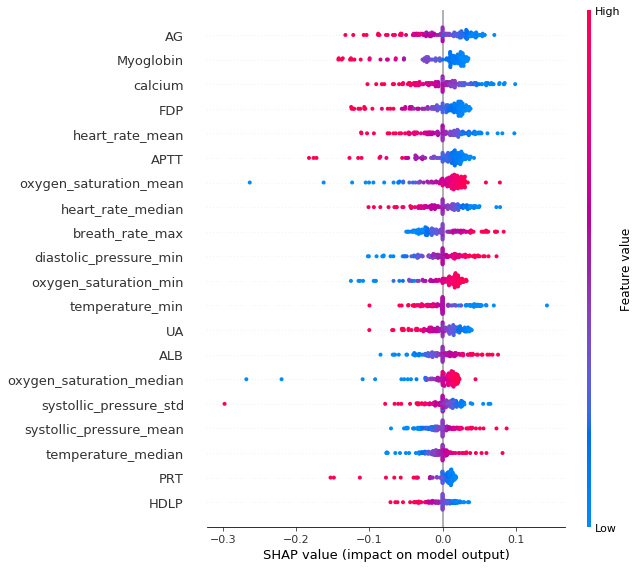

In [33]:
shap.summary_plot(shap_values[1], X_test)

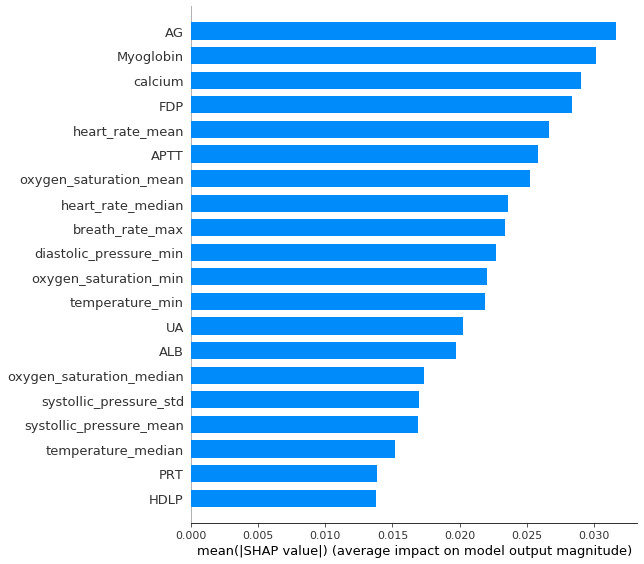

In [34]:
# summarize the effects of all the features
shap.summary_plot(shap_values[0], X_test, plot_type="bar")

In [19]:
joblib.dump(svc, './models/SVC.pkl')

['./models/SVC.pkl']

# step6: DecisionTreeClassifier

In [35]:
tree = DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=10, splitter='best')

tree.fit(X_train, y_train)

tree_y_predict = tree.predict(X_test)
tree_y_probs = tree.predict_proba(X_test) # 模型的预测得分

train_tree_y_score = tree.score(X_train, y_train)
test_tree_y_score = tree.score(X_test, y_test)
print("Accuracy of DecisionTreeClassifier(Train): {score}".format(score=train_tree_y_score))
print("Accuracy of DecisionTreeClassifier(Test): {score}".format(score=test_tree_y_score))

Accuracy of DecisionTreeClassifier(Train): 0.9621993127147767
Accuracy of DecisionTreeClassifier(Test): 0.821917808219178


In [36]:
print("DecisionTreeClassifier: ")
print("ACCURACY         : {score}".format(score=accuracy_score(y_test, tree_y_predict)))           # 准确率
print("AUC              : {score}".format(score=roc_auc_score(y_test, tree_y_probs[:, 1])))        # AUC
print("RECALL           : {score}".format(score=recall_score(y_test, tree_y_predict)))             # 召回率
print("PRECISION        : {score}".format(score=precision_score(y_test, tree_y_predict)))          # 正确率
print("BALANCED_ACCURACY: {score}".format(score=balanced_accuracy_score(y_test, tree_y_predict)))  # 平衡精度

DecisionTreeClassifier: 
ACCURACY         : 0.821917808219178
AUC              : 0.8260329645518175
RECALL           : 0.8737864077669902
PRECISION        : 0.8737864077669902
BALANCED_ACCURACY: 0.7857304131858207


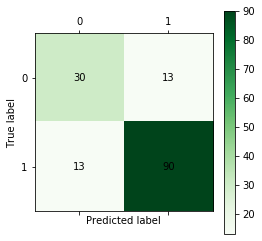

In [37]:
# 混淆矩阵
cm_plot(y_test, tree_y_predict).show()

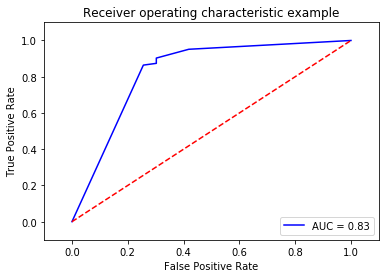

In [38]:
# ROC曲线
fpr, tpr, thresholds = roc_curve(y_test, tree_y_probs[:, 1])
roc_auc = auc(fpr, tpr)  # auc为Roc曲线下的面积

plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.xlabel('False Positive Rate') # 横坐标是fpr
plt.ylabel('True Positive Rate')  # 纵坐标是tpr
plt.title('Receiver operating characteristic example')
plt.show()

In [39]:
# 特征重要性
importances = tree.feature_importances_
feat_labels = data.columns[:-1]
indices = np.argsort(importances)[::-1]
for f in range(X_train.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30, feat_labels[indices[f]], importances[indices[f]]))

 1) oxygen_saturation_max          0.244797
 2) MCKMB                          0.200872
 3) breath_rate_std                0.062378
 4) diastolic_pressure_min         0.051665
 5) oxygen_saturation_mean         0.042057
 6) systollic_pressure_std         0.034544
 7) Creatinine                     0.029979
 8) diastolic_pressure_mean        0.027622
 9) temperature_median             0.025276
10) diastolic_pressure_std         0.024991
11) ESPC                           0.023054
12) UA                             0.022999
13) LPPC                           0.022674
14) TTBA                           0.021173
15) TBB                            0.017542
16) cholesterol                    0.016161
17) systollic_pressure_min         0.015387
18) FEU                            0.014359
19) DSHA                           0.013764
20) heart_rate_min                 0.013530
21) ALB                            0.013487
22) RBCSD                          0.012698
23) UNP                         

In [41]:
# 多个预测的解释
explainer = shap.KernelExplainer(tree.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

Using 582 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


A Jupyter Widget

In [42]:
y_base = explainer.expected_value  # shap均值
print(y_base)

[0.33865969 0.66134031]


In [44]:
tree.predict_proba(X_test)  # 0--死亡， 1--存活 

array([[1.        , 0.        ],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.80737705, 0.19262295],
       [0.80737705, 0.19262295],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [0.

In [45]:
pd.Series(tree_y_predict).value_counts()

1    103
0     43
dtype: int64

In [46]:
# 单个预测的解释
row_to_show = 0
shap.force_plot(explainer.expected_value[1], shap_values[1][row_to_show, :], X_test.iloc[row_to_show,:])

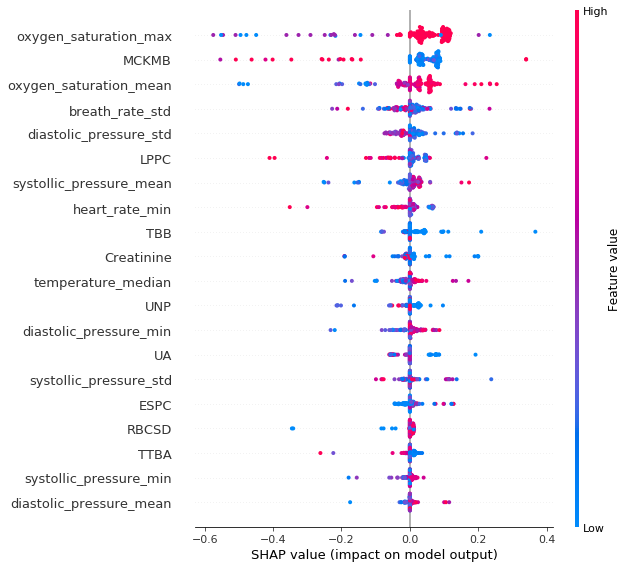

In [47]:
shap.summary_plot(shap_values[1], X_test)

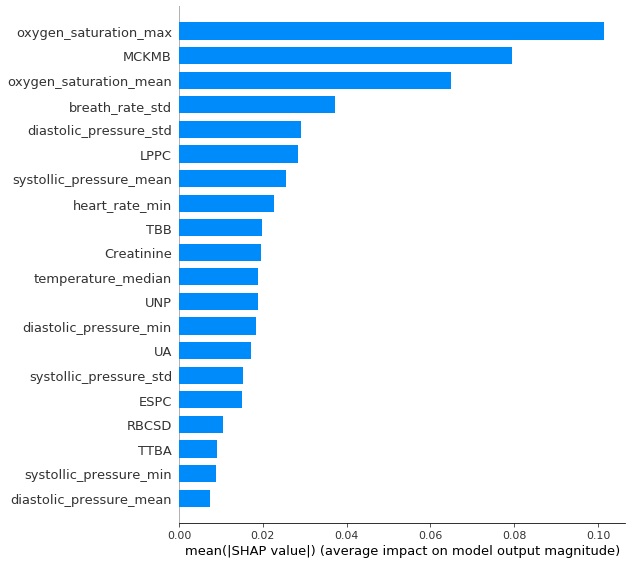

In [48]:
# summarize the effects of all the features
shap.summary_plot(shap_values[0], X_test, plot_type="bar")

In [24]:
# joblib.dump(tree, './models/TREE.pkl')

['./models/TREE.pkl']

# step7: RandomForestClassifier

In [49]:
rf = RandomForestClassifier(n_estimators= 71, max_depth=5, min_samples_split=63,
                            min_samples_leaf=10, max_features='sqrt', oob_score=True, random_state=10)

rf.fit(X_train, y_train)

rf_y_predict = rf.predict(X_test)
rf_y_probs = rf.predict_proba(X_test) # 模型的预测得分

train_rf_y_score = rf.score(X_train, y_train)
test_rf_y_score = rf.score(X_test, y_test)
print("Accuracy of RandomForestClassifier(Train): {score}".format(score=train_rf_y_score)) 
print("Accuracy of RandomForestClassifier(Test): {score}".format(score=test_rf_y_score))

Accuracy of RandomForestClassifier(Train): 0.8900343642611683
Accuracy of RandomForestClassifier(Test): 0.8972602739726028


In [50]:
print("RandomForestClassifier: ")
print("ACCURACY         : {score}".format(score=accuracy_score(y_test, rf_y_predict)))           # 准确率
print("AUC              : {score}".format(score=roc_auc_score(y_test, rf_y_probs[:, 1])))        # AUC (在偏态的样本中更稳健)
print("RECALL           : {score}".format(score=recall_score(y_test, rf_y_predict)))             # 召回率
print("PRECISION        : {score}".format(score=precision_score(y_test, rf_y_predict)))          # 正确率
print("BALANCED_ACCURACY: {score}".format(score=balanced_accuracy_score(y_test, rf_y_predict)))  # 平衡精度

RandomForestClassifier: 
ACCURACY         : 0.8972602739726028
AUC              : 0.9491984646647099
RECALL           : 0.970873786407767
PRECISION        : 0.8928571428571429
BALANCED_ACCURACY: 0.8459020094829532


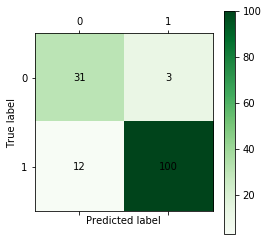

In [51]:
# 混淆矩阵
cm_plot(y_test, rf_y_predict).show()

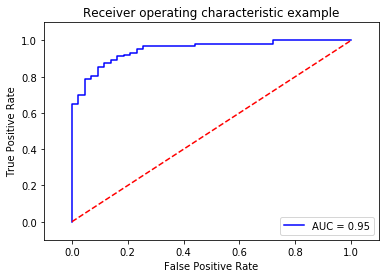

In [52]:
# ROC曲线
fpr, tpr, thresholds = roc_curve(y_test, rf_y_probs[:, 1])
roc_auc = auc(fpr, tpr)  # auc为Roc曲线下的面积

plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.xlabel('False Positive Rate') # 横坐标是fpr
plt.ylabel('True Positive Rate')  # 纵坐标是tpr
plt.title('Receiver operating characteristic example')
plt.show()

In [53]:
rf.feature_importances_

array([0.00130101, 0.        , 0.        , 0.01950782, 0.000141  ,
       0.00026538, 0.        , 0.00591019, 0.00483123, 0.02152532,
       0.00514732, 0.01477114, 0.00738418, 0.        , 0.01304386,
       0.00187188, 0.00431584, 0.00326055, 0.0049423 , 0.01786229,
       0.01389815, 0.01154181, 0.00363293, 0.00321974, 0.00241428,
       0.00994129, 0.00449367, 0.00835733, 0.11539279, 0.00777457,
       0.04001481, 0.11438148, 0.03052371, 0.        , 0.00056376,
       0.        , 0.00014044, 0.        , 0.0006467 , 0.00189307,
       0.00026898, 0.00130054, 0.00116273, 0.0022224 , 0.00282765,
       0.00098789, 0.00091944, 0.00140311, 0.        , 0.01133303,
       0.00274386, 0.        , 0.        , 0.00024933, 0.        ,
       0.        , 0.00133242, 0.00391095, 0.00327114, 0.00041523,
       0.00068016, 0.00058827, 0.00099736, 0.        , 0.        ,
       0.0005291 , 0.01261123, 0.        , 0.01910469, 0.        ,
       0.        , 0.0005072 , 0.        , 0.00069013, 0.00181

In [54]:
# 特征重要性
importances = rf.feature_importances_
feat_labels = data.columns[:-1]
indices = np.argsort(importances)[::-1]
for f in range(X_train.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30, feat_labels[indices[f]], importances[indices[f]]))

 1) oxygen_saturation_max          0.115393
 2) oxygen_saturation_mean         0.114381
 3) MCKMB                          0.082599
 4) Myoglobin                      0.061503
 5) Troponin                       0.052801
 6) oxygen_saturation_median       0.040015
 7) oxygen_saturation_std          0.030524
 8) APTTR                          0.029626
 9) PRT                            0.029517
10) APTT                           0.028372
11) UNP                            0.028210
12) TTBA                           0.022202
13) heart_rate_min                 0.021525
14) temperature_max                0.019508
15) INR                            0.019433
16) UA                             0.019105
17) systollic_pressure_min         0.017862
18) TBTR                           0.016833
19) CO2BF                          0.016137
20) heart_rate_mean                0.014771
21) AG                             0.014704
22) FDP                            0.014012
23) systollic_pressure_median   

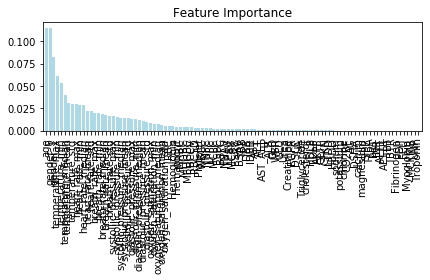

In [55]:
plt.title('Feature Importance')
plt.bar(range(X_train.shape[1]), importances[indices], color='lightblue', align='center')
plt.xticks(range(X_train.shape[1]), feat_labels, rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.tight_layout()
plt.show()

In [56]:
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_train)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_train)

In [57]:
y_base = explainer.expected_value  # shap均值
print(y_base)

[0.32404046 0.67595954]


In [58]:
rf.predict_proba(X_train)  # 0--死亡， 1--存活 

array([[0.15407224, 0.84592776],
       [0.28184742, 0.71815258],
       [0.09481259, 0.90518741],
       ...,
       [0.69491572, 0.30508428],
       [0.75709337, 0.24290663],
       [0.31858217, 0.68141783]])

In [59]:
# 单个预测的解释
row_to_show = 0
shap.force_plot(explainer.expected_value[1], shap_values[1][row_to_show, :], X_train.iloc[row_to_show,:])

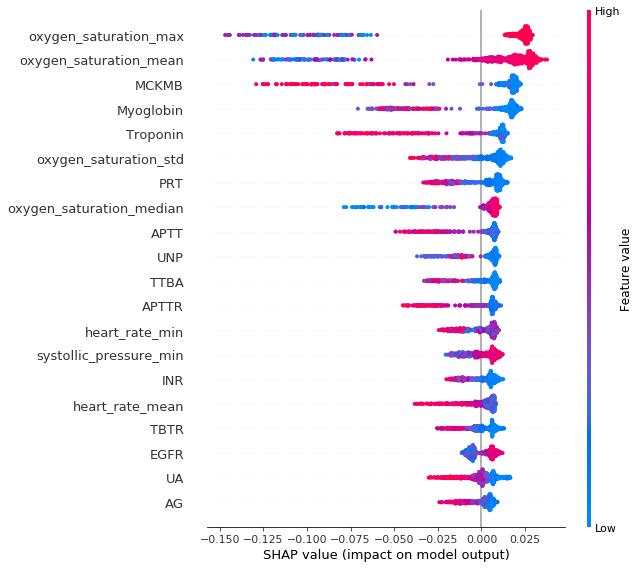

In [61]:
shap.summary_plot(shap_values[1], X_train)

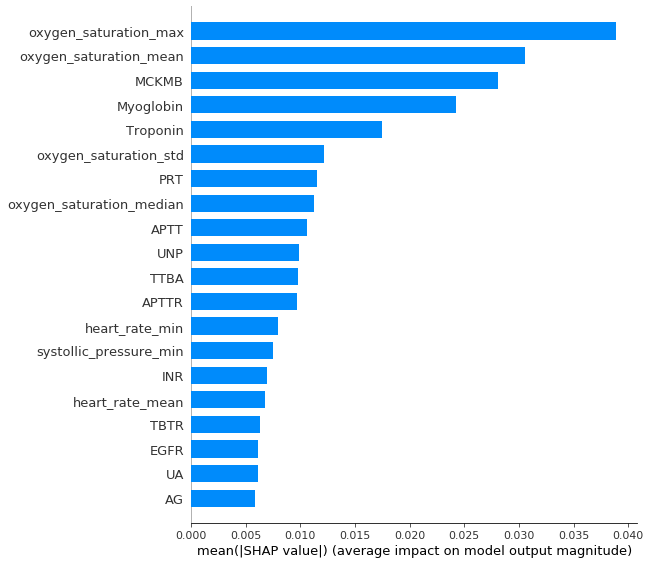

In [62]:
# summarize the effects of all the features
shap.summary_plot(shap_values[0], X_train, plot_type="bar")

In [31]:
# joblib.dump(rf, './models/RF.pkl')

['./models/RF.pkl']

# step8: AdaBoostClassifier

In [63]:
abc = AdaBoostClassifier(base_estimator=None, n_estimators=103, learning_rate=1.0, algorithm='SAMME.R', random_state=10)

abc.fit(X_train, y_train)

abc_y_predict = abc.predict(X_test)
abc_y_probs = abc.predict_proba(X_test) # 模型的预测得分

train_abc_y_score = abc.score(X_train, y_train)
test_abc_y_score = abc.score(X_test, y_test)
print("Accuracy of AdaBoostClassifier(Train): {score}".format(score=train_abc_y_score)) 
print("Accuracy of AdaBoostClassifier(Test): {score}".format(score=test_abc_y_score)) 

Accuracy of AdaBoostClassifier(Train): 1.0
Accuracy of AdaBoostClassifier(Test): 0.9383561643835616


In [64]:
print("AdaBoostClassifier: ")
print("ACCURACY         : {score}".format(score=accuracy_score(y_test, abc_y_predict)))           # 准确率
print("AUC              : {score}".format(score=roc_auc_score(y_test, abc_y_probs[:, 1])))        # AUC
print("RECALL           : {score}".format(score=recall_score(y_test, abc_y_predict)))             # 召回率
print("PRECISION        : {score}".format(score=precision_score(y_test, abc_y_predict)))          # 正确率
print("BALANCED_ACCURACY: {score}".format(score=balanced_accuracy_score(y_test, abc_y_predict)))  # 平衡精度

AdaBoostClassifier: 
ACCURACY         : 0.9383561643835616
AUC              : 0.963197109957101
RECALL           : 0.9611650485436893
PRECISION        : 0.9519230769230769
BALANCED_ACCURACY: 0.9224429893881237


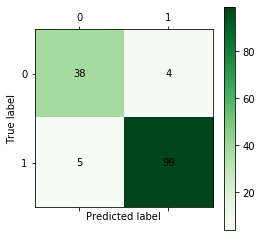

In [65]:
# 混淆矩阵
cm_plot(y_test, abc_y_predict).show()

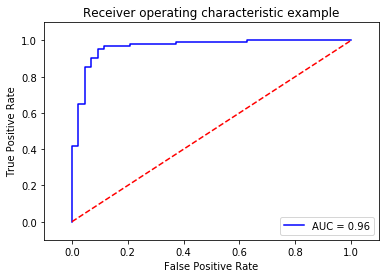

In [66]:
# ROC曲线
fpr, tpr, thresholds = roc_curve(y_test, abc_y_probs[:, 1])
roc_auc = auc(fpr, tpr)  # auc为Roc曲线下的面积

plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.xlabel('False Positive Rate') # 横坐标是fpr
plt.ylabel('True Positive Rate')  # 纵坐标是tpr
plt.title('Receiver operating characteristic example')
plt.show()

In [67]:
# 特征重要性
importances = abc.feature_importances_
feat_labels = data.columns[:-1]
indices = np.argsort(importances)[::-1]
for f in range(X_train.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30, feat_labels[indices[f]], importances[indices[f]]))

 1) heart_rate_min                 0.058252
 2) UNP                            0.048544
 3) oxygen_saturation_mean         0.038835
 4) TTBA                           0.038835
 5) Troponin                       0.029126
 6) HDLP                           0.029126
 7) systollic_pressure_std         0.029126
 8) systollic_pressure_min         0.029126
 9) calcium                        0.029126
10) breath_rate_std                0.029126
11) ALB                            0.029126
12) Myoglobin                      0.029126
13) TBT                            0.029126
14) MCKMB                          0.029126
15) temperature_max                0.029126
16) MRBC                           0.019417
17) Platelet                       0.019417
18) MCPC                           0.019417
19) breath_rate_min                0.019417
20) oxygen_saturation_max          0.019417
21) Urea                           0.019417
22) AST                            0.019417
23) temperature_median          

In [69]:
# 多个预测的解释
explainer = shap.KernelExplainer(abc.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

Using 582 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


A Jupyter Widget

In [70]:
y_base = explainer.expected_value  # shap均值
print(y_base)

[0.49276169 0.50723831]


In [71]:
abc.predict_proba(X_train)  # 0--死亡， 1--存活 

array([[0.47095245, 0.52904755],
       [0.49098351, 0.50901649],
       [0.47889249, 0.52110751],
       ...,
       [0.51587321, 0.48412679],
       [0.57477801, 0.42522199],
       [0.51387709, 0.48612291]])

In [72]:
pd.Series(abc_y_predict).value_counts()

1    104
0     42
dtype: int64

In [73]:
# 单个预测的解释
row_to_show = 0
shap.force_plot(explainer.expected_value[1], shap_values[1][row_to_show, :], X_test.iloc[row_to_show,:])

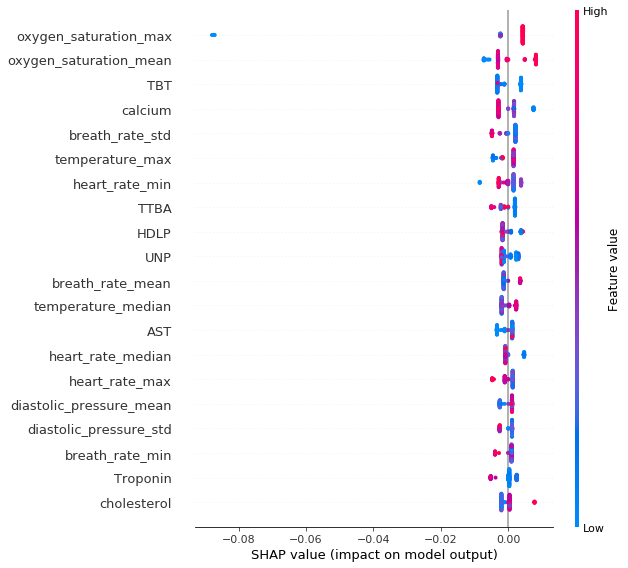

In [74]:
shap.summary_plot(shap_values[1], X_test)

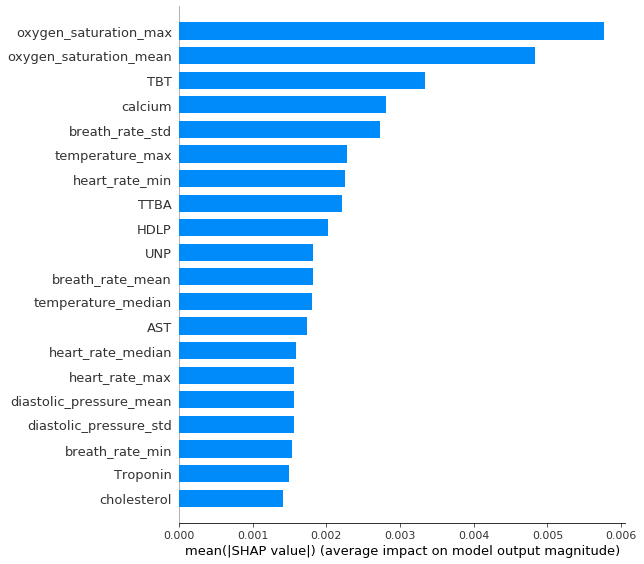

In [75]:
# summarize the effects of all the features
shap.summary_plot(shap_values[0], X_test, plot_type="bar")

In [36]:
# joblib.dump(abc, './models/ABC.pkl')

['./models/ABC.pkl']

# step9: GradientBoostingClassifier

In [76]:
gbc = GradientBoostingClassifier(learning_rate=0.1, n_estimators=116, max_depth=9, max_features=10, 
                                  min_samples_leaf=62, min_samples_split=60, random_state=10)

gbc.fit(X_train, y_train)

gbc_y_predict = gbc.predict(X_test)
gbc_y_probs = gbc.predict_proba(X_test) # 模型的预测得分

train_gbc_y_score = gbc.score(X_train, y_train)
test_gbc_y_score = gbc.score(X_test, y_test)
print("Accuracy of AdaBoostClassifier(Train): {score}".format(score=train_gbc_y_score)) 
print("Accuracy of AdaBoostClassifier(Test): {score}".format(score=test_gbc_y_score))

Accuracy of AdaBoostClassifier(Train): 0.9982817869415808
Accuracy of AdaBoostClassifier(Test): 0.9178082191780822


In [77]:
print("GradientBoostingClassifier: ")
print("ACCURACY         : {score}".format(score=accuracy_score(y_test, gbc_y_predict)))           # 准确率
print("AUC              : {score}".format(score=roc_auc_score(y_test, gbc_y_probs[:, 1])))        # AUC
print("RECALL           : {score}".format(score=recall_score(y_test, gbc_y_predict)))             # 召回率
print("PRECISION        : {score}".format(score=precision_score(y_test, gbc_y_predict)))          # 正确率
print("BALANCED_ACCURACY: {score}".format(score=balanced_accuracy_score(y_test, gbc_y_predict)))  # 平衡精度

GradientBoostingClassifier: 
ACCURACY         : 0.9178082191780822
AUC              : 0.9729058478211786
RECALL           : 0.9320388349514563
PRECISION        : 0.9504950495049505
BALANCED_ACCURACY: 0.9078798825920072


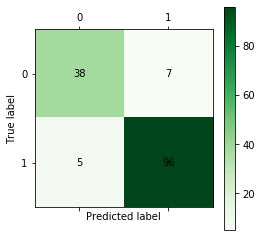

In [78]:
# 混淆矩阵
cm_plot(y_test, gbc_y_predict).show()

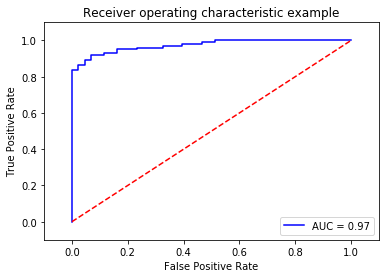

In [79]:
# ROC曲线
fpr, tpr, thresholds = roc_curve(y_test, gbc_y_probs[:, 1])
roc_auc = auc(fpr, tpr)  # auc为Roc曲线下的面积

plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.xlabel('False Positive Rate') # 横坐标是fpr
plt.ylabel('True Positive Rate')  # 纵坐标是tpr
plt.title('Receiver operating characteristic example')
plt.show()

In [84]:
# 特征重要性
importances = gbc.feature_importances_
feat_labels = data.columns[:-1]
indices = np.argsort(importances)[::-1]
for f in range(X_train.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30, feat_labels[indices[f]], importances[indices[f]]))

 1) Troponin                       0.091245
 2) oxygen_saturation_max          0.089761
 3) MCKMB                          0.075888
 4) oxygen_saturation_mean         0.070732
 5) heart_rate_min                 0.040497
 6) Myoglobin                      0.035807
 7) INR                            0.033524
 8) APTTR                          0.033130
 9) oxygen_saturation_std          0.030855
10) systollic_pressure_median      0.030336
11) oxygen_saturation_median       0.025132
12) diastolic_pressure_mean        0.023005
13) breath_rate_min                0.022910
14) PRT                            0.022860
15) TTBA                           0.020627
16) UNP                            0.017969
17) TBTR                           0.017609
18) diastolic_pressure_std         0.017564
19) temperature_max                0.015305
20) oxygen_saturation_min          0.014824
21) AG                             0.013794
22) diastolic_pressure_min         0.013622
23) CO2BF                       

In [91]:
# 多个预测的解释
explainer = shap.KernelExplainer(gbc.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

Using 582 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


A Jupyter Widget

In [92]:
y_base = explainer.expected_value  # shap均值
print(y_base)

[0.32314673 0.67685327]


In [93]:
gbc.predict_proba(X_train)  # 0--死亡， 1--存活 

array([[0.02580993, 0.97419007],
       [0.10864906, 0.89135094],
       [0.01679927, 0.98320073],
       ...,
       [0.92686395, 0.07313605],
       [0.99219475, 0.00780525],
       [0.891251  , 0.108749  ]])

In [94]:
pd.Series(gbc_y_predict).value_counts()

1    101
0     45
dtype: int64

In [95]:
# 单个预测的解释
row_to_show = 0
shap.force_plot(explainer.expected_value[1], shap_values[1][row_to_show, :], X_test.iloc[row_to_show,:])

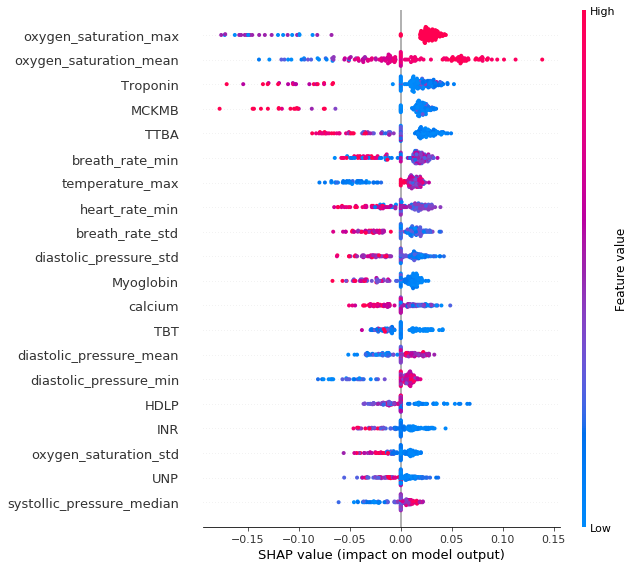

In [96]:
shap.summary_plot(shap_values[1], X_test)

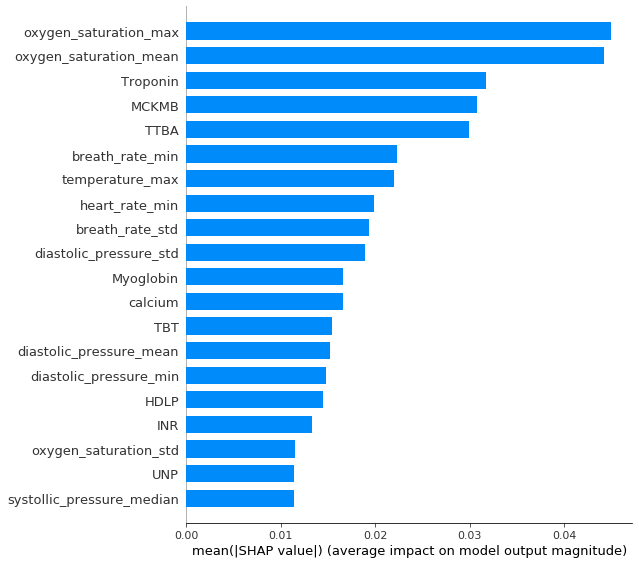

In [97]:
# summarize the effects of all the features
shap.summary_plot(shap_values[0], X_test, plot_type="bar")

In [41]:
# joblib.dump(gbc, './models/GBC.pkl')

['./models/GBC.pkl']

# step10: GaussianNB

In [98]:
gnb = GaussianNB()

gnb.fit(X_train, y_train)

gnb_y_predict = gnb.predict(X_test)
gnb_y_probs = gnb.predict_proba(X_test) # 模型的预测得分

train_gnb_y_score = gnb.score(X_train, y_train)
test_gnb_y_score = gnb.score(X_test, y_test)
print("Accuracy of AdaBoostClassifier(Train): {score}".format(score=train_gnb_y_score)) 
print("Accuracy of AdaBoostClassifier(Test): {score}".format(score=test_gnb_y_score)) 

Accuracy of AdaBoostClassifier(Train): 0.8109965635738832
Accuracy of AdaBoostClassifier(Test): 0.8013698630136986


In [99]:
print("GaussianNB: ")
print("ACCURACY         : {score}".format(score=accuracy_score(y_test, gnb_y_predict)))           # 准确率
print("AUC              : {score}".format(score=roc_auc_score(y_test, gnb_y_probs[:, 1])))        # AUC
print("RECALL           : {score}".format(score=recall_score(y_test, gnb_y_predict)))             # 召回率
print("PRECISION        : {score}".format(score=precision_score(y_test, gnb_y_predict)))          # 正确率
print("BALANCED_ACCURACY: {score}".format(score=balanced_accuracy_score(y_test, gnb_y_predict)))  # 平衡精度

GaussianNB: 
ACCURACY         : 0.8013698630136986
AUC              : 0.821517272522014
RECALL           : 0.883495145631068
PRECISION        : 0.8425925925925926
BALANCED_ACCURACY: 0.7440731542108828


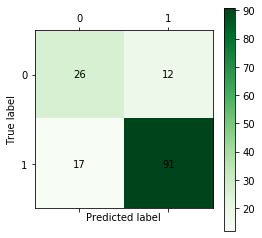

In [100]:
# 混淆矩阵
cm_plot(y_test, gnb_y_predict).show()

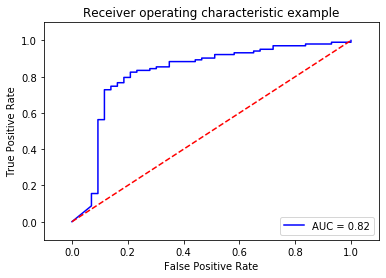

In [101]:
# ROC曲线
fpr, tpr, thresholds = roc_curve(y_test, gnb_y_probs[:, 1])
roc_auc = auc(fpr, tpr)  # auc为Roc曲线下的面积

plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.xlabel('False Positive Rate') # 横坐标是fpr
plt.ylabel('True Positive Rate')  # 纵坐标是tpr
plt.title('Receiver operating characteristic example')
plt.show()

In [102]:
# 多个预测的解释
explainer = shap.KernelExplainer(gnb.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

Using 582 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


A Jupyter Widget

In [103]:
y_base = explainer.expected_value  # shap均值
print(y_base)

[0.29334052 0.70665948]


In [104]:
gnb.predict_proba(X_test)  # 0--死亡， 1--存活 

array([[3.88686794e-001, 6.11313206e-001],
       [1.30189483e-001, 8.69810517e-001],
       [5.71035800e-006, 9.99994290e-001],
       [7.83282595e-007, 9.99999217e-001],
       [2.29509918e-008, 9.99999977e-001],
       [9.86028582e-005, 9.99901397e-001],
       [1.33990005e-001, 8.66009995e-001],
       [1.77721311e-009, 9.99999998e-001],
       [5.73112764e-006, 9.99994269e-001],
       [2.59566649e-011, 1.00000000e+000],
       [1.44842642e-010, 1.00000000e+000],
       [1.00000000e+000, 4.06029630e-230],
       [2.31833196e-009, 9.99999998e-001],
       [1.18875454e-002, 9.88112455e-001],
       [7.26585526e-009, 9.99999993e-001],
       [1.28219820e-011, 1.00000000e+000],
       [1.00000000e+000, 1.57888471e-020],
       [3.86872858e-008, 9.99999961e-001],
       [9.99990321e-001, 9.67878827e-006],
       [1.02025587e-005, 9.99989797e-001],
       [2.91251154e-007, 9.99999709e-001],
       [1.81124907e-010, 1.00000000e+000],
       [2.05448178e-011, 1.00000000e+000],
       [1.3

In [105]:
pd.Series(gnb_y_predict).value_counts()

1    108
0     38
dtype: int64

In [106]:
# 单个预测的解释
row_to_show = 0
shap.force_plot(explainer.expected_value[1], shap_values[1][row_to_show, :], X_test.iloc[row_to_show,:])

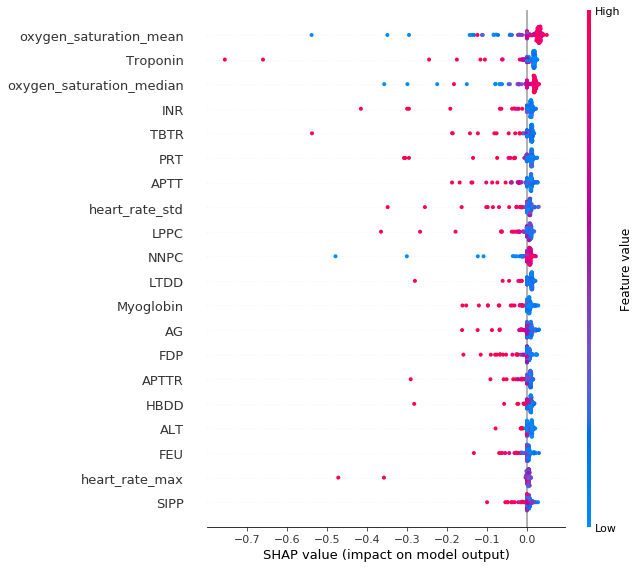

In [107]:
shap.summary_plot(shap_values[1], X_test)

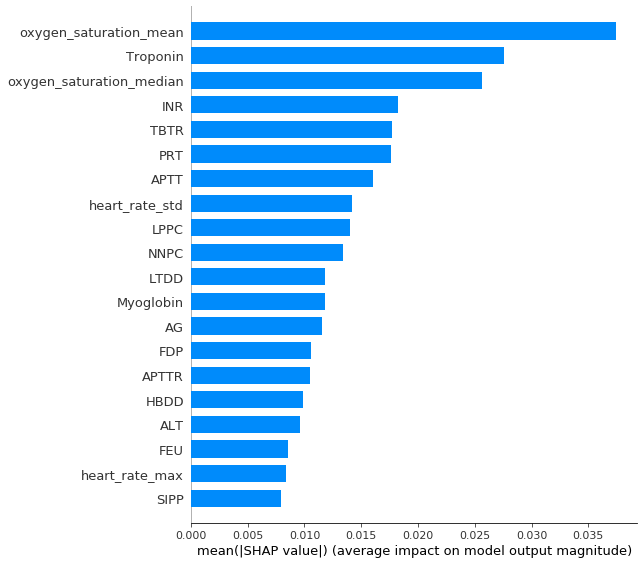

In [108]:
# summarize the effects of all the features
shap.summary_plot(shap_values[0], X_test, plot_type="bar")

In [46]:
#joblib.dump(gnb, './models/GNB.pkl')

['./models/GNB.pkl']

# step11: ANN

In [109]:
# split train and validate
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=0)

In [110]:
# build nn model
model = Sequential()
model.add(Dense(input_dim=101, units=64))
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(Dense(input_dim=64, units=16))
model.add(Activation('relu'))
model.add(Dense(input_dim=16, units=1))
model.add(Activation('sigmoid'))

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
print("Starting training ")
history = model.fit(X_train, y_train, epochs=100, batch_size=12, validation_data=(X_val, y_val))
print("Training finished \n")

nn_y_predict = model.predict_classes(X_test).reshape(len(y_test))

Starting training 
Train on 465 samples, validate on 117 samples
Epoch 1/100
465/465 [==============================] - 2s 5ms/step - loss: 0.6718 - acc: 0.5613 - val_loss: 0.5742 - val_acc: 0.7436
Epoch 2/100
465/465 [==============================] - 0s 140us/step - loss: 0.6041 - acc: 0.6839 - val_loss: 0.5470 - val_acc: 0.7521
Epoch 3/100
465/465 [==============================] - 0s 144us/step - loss: 0.5522 - acc: 0.7269 - val_loss: 0.5003 - val_acc: 0.7778
Epoch 4/100
465/465 [==============================] - 0s 157us/step - loss: 0.5233 - acc: 0.7570 - val_loss: 0.4933 - val_acc: 0.7778
Epoch 5/100
465/465 [==============================] - 0s 136us/step - loss: 0.4955 - acc: 0.7828 - val_loss: 0.4992 - val_acc: 0.7607
Epoch 6/100
465/465 [==============================] - 0s 138us/step - loss: 0.4849 - acc: 0.7935 - val_loss: 0.4878 - val_acc: 0.7521
Epoch 7/100
465/465 [==============================] - 0s 138us/step - loss: 0.4694 - acc: 0.8000 - val_loss: 0.4938 - val_acc:

Epoch 61/100
465/465 [==============================] - 0s 148us/step - loss: 0.1494 - acc: 0.9441 - val_loss: 0.6176 - val_acc: 0.8120
Epoch 62/100
465/465 [==============================] - 0s 118us/step - loss: 0.1530 - acc: 0.9398 - val_loss: 0.6852 - val_acc: 0.7521
Epoch 63/100
465/465 [==============================] - 0s 118us/step - loss: 0.1449 - acc: 0.9527 - val_loss: 0.6174 - val_acc: 0.7949
Epoch 64/100
465/465 [==============================] - 0s 118us/step - loss: 0.1378 - acc: 0.9548 - val_loss: 0.6524 - val_acc: 0.7778
Epoch 65/100
465/465 [==============================] - 0s 121us/step - loss: 0.1374 - acc: 0.9484 - val_loss: 0.6935 - val_acc: 0.7607
Epoch 66/100
465/465 [==============================] - 0s 120us/step - loss: 0.1444 - acc: 0.9634 - val_loss: 0.6489 - val_acc: 0.7863
Epoch 67/100
465/465 [==============================] - 0s 116us/step - loss: 0.1121 - acc: 0.9656 - val_loss: 0.6361 - val_acc: 0.7949
Epoch 68/100
465/465 [==========================

In [111]:
# testing accuracy
scores = model.evaluate(X_train, y_train)
print("Training Accuracy: %.2f%%\n" % (scores[1]*100))

scores = model.evaluate(X_test, y_test)
print("Testing Accuracy: %.2f%%\n" % (scores[1]*100))

465/465 [==============================] - 0s 32us/step
Training Accuracy: 98.28%

146/146 [==============================] - 0s 48us/step
Testing Accuracy: 83.56%



In [112]:
history_dict = history.history
history_dict.keys()

dict_keys(['val_loss', 'val_acc', 'loss', 'acc'])

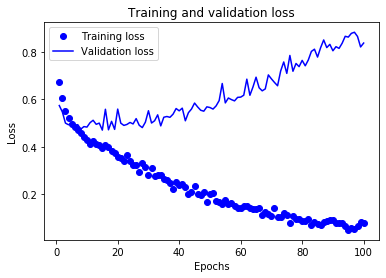

In [113]:
# loss
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1,len(loss_values)+1)
plt.plot(epochs,loss_values,'bo',label='Training loss')
plt.plot(epochs,val_loss_values,'b',label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

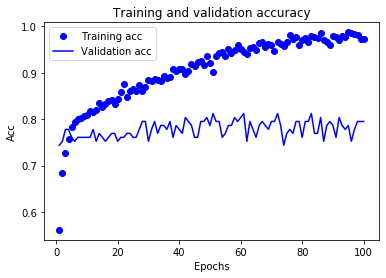

In [114]:
# acc
acc_values = history_dict['acc']
val_acc_values = history_dict['val_acc']

plt.plot(epochs,acc_values,'bo',label='Training acc')
plt.plot(epochs,val_acc_values,'b',label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Acc')
plt.legend()
# plt.savefig('model loss and accuracy.png')

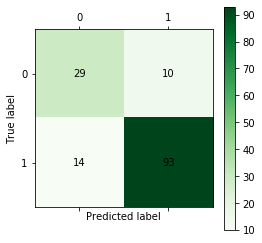

In [115]:
cm_plot(y_test, nn_y_predict).show()

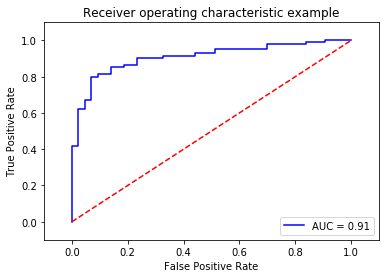

In [116]:
# ROC曲线
y_test_pred_probs = model.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_probs)
roc_auc = auc(fpr, tpr)  # auc为Roc曲线下的面积

plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.xlabel('False Positive Rate') # 横坐标是fpr
plt.ylabel('True Positive Rate')  # 纵坐标是tpr
plt.title('Receiver operating characteristic example')
plt.show()
# plt.savefig('roc.png')

In [117]:
# 多个预测的解释
explainer = shap.KernelExplainer(model.predict, X_train)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

Using 465 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


A Jupyter Widget

In [118]:
y_base = explainer.expected_value  # shap均值
print(y_base)

[0.68408147]


In [120]:
# 单个预测的解释
row_to_show = 0
shap.force_plot(explainer.expected_value[0], shap_values[0][row_to_show, :], X_test.iloc[row_to_show,:])

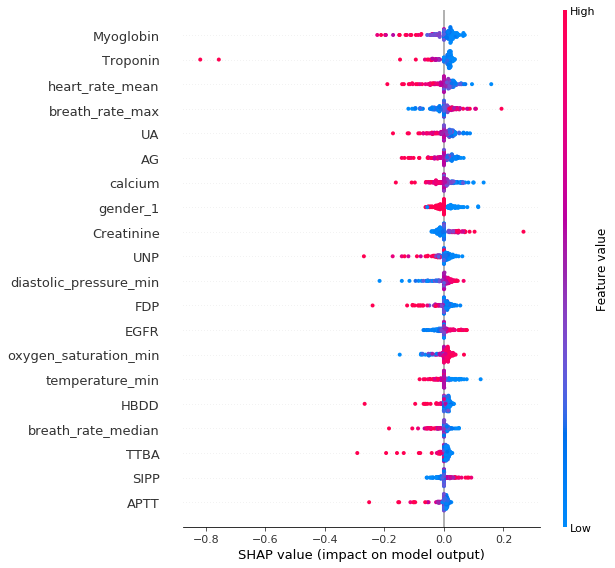

In [122]:
shap.summary_plot(shap_values[0], X_test)

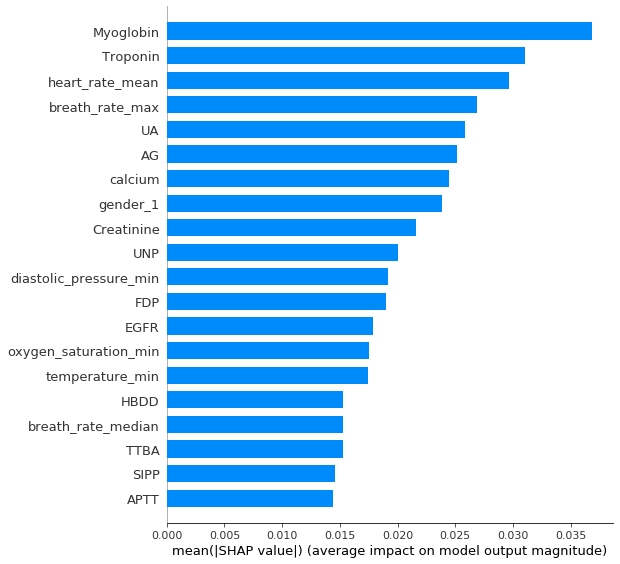

In [123]:
# summarize the effects of all the features
shap.summary_plot(shap_values[0], X_test, plot_type="bar")

# step12: Results Comparison of 5 Cross Validation

In [47]:
results_lr = []
for my_score in ['accuracy', 'roc_auc', 'recall', 'precision', 'balanced_accuracy']:
        #print(cross_val_score(lr, X, y, cv=5, scoring=my_score).mean())
        results_lr.append(cross_val_score(lr, X, y, cv=5, scoring=my_score).mean())

results_knn = []
for my_score in ['accuracy', 'roc_auc', 'recall', 'precision', 'balanced_accuracy']:
        results_knn.append(cross_val_score(knn, X, y, cv=5, scoring=my_score).mean())
        
results_svc = []
for my_score in ['accuracy', 'roc_auc', 'recall', 'precision', 'balanced_accuracy']:
        results_svc.append(cross_val_score(svc, X, y, cv=5, scoring=my_score).mean())
        
results_tree = []
for my_score in ['accuracy', 'roc_auc', 'recall', 'precision', 'balanced_accuracy']:
        results_tree.append(cross_val_score(tree, X, y, cv=5, scoring=my_score).mean())
        
results_rf = []
for my_score in ['accuracy', 'roc_auc', 'recall', 'precision', 'balanced_accuracy']:
        results_rf.append(cross_val_score(rf, X, y, cv=5, scoring=my_score).mean())
        
results_abc = []
for my_score in ['accuracy', 'roc_auc', 'recall', 'precision', 'balanced_accuracy']:
        results_abc.append(cross_val_score(abc, X, y, cv=5, scoring=my_score).mean())
        
results_gbc = []
for my_score in ['accuracy', 'roc_auc', 'recall', 'precision', 'balanced_accuracy']:
        results_gbc.append(cross_val_score(gbc, X, y, cv=5, scoring=my_score).mean())
        
results_gnb = []
for my_score in ['accuracy', 'roc_auc', 'recall', 'precision', 'balanced_accuracy']:
        results_gnb.append(cross_val_score(gnb, X, y, cv=5, scoring=my_score).mean())
        
results_nn = []
for my_score in ['accuracy', 'roc_auc', 'recall', 'precision', 'balanced_accuracy']:
        results_nn.append(cross_val_score(gnb, X, y, cv=5, scoring=my_score).mean())

In [48]:
results = [results_lr, results_knn, results_svc, results_tree, results_rf, results_abc, results_gbc, results_gnb]

In [49]:
# 用表格展示
results_compare = pd.DataFrame(results)
results_compare.columns = ['ACCURACY(mean)', 'AUC(mean)', 'RECALL(mean)', 'PRECISION(mean)', 'BALANCED_ACCURACY(mean)']
results_compare.index = ['LR Classifier', 'KNN Classifier', 'SVC Classifier', 'DecisionTreeClassifier',
                        'RandomForestClassifier', 'AdaBoostClassifier', 'GradientBoostingClassifier', 'GaussianNB']

In [50]:
results_compare

,ACCURACY(mean),AUC(mean),RECALL(mean),PRECISION(mean),BALANCED_ACCURACY(mean)
LR Classifier,0.791313,0.853266,0.833232,0.859288,0.767079
KNN Classifier,0.766430,0.756018,0.949677,0.766896,0.660870
SVC Classifier,0.811909,0.850794,0.923657,0.823699,0.747675
DecisionTreeClassifier,0.772078,0.769863,0.812929,0.848259,0.748602
RandomForestClassifier,0.863937,0.908934,0.955778,0.863300,0.811145
AdaBoostClassifier,0.854338,0.908338,0.921556,0.875984,0.815681
GradientBoostingClassifier,0.885902,0.935226,0.943657,0.898491,0.852772
GaussianNB,0.778768,0.800297,0.834990,0.843674,0.746450


In [51]:
# 高亮最大值
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color:yellow' if v else '' for v in is_max]

results_compare.style.apply(highlight_max)

,ACCURACY(mean),AUC(mean),RECALL(mean),PRECISION(mean),BALANCED_ACCURACY(mean)
LR Classifier,0.791313,0.853266,0.833232,0.859288,0.767079
KNN Classifier,0.76643,0.756018,0.949677,0.766896,0.66087
SVC Classifier,0.811909,0.850794,0.923657,0.823699,0.747675
DecisionTreeClassifier,0.772078,0.769863,0.812929,0.848259,0.748602
RandomForestClassifier,0.863937,0.908934,0.955778,0.8633,0.811145
AdaBoostClassifier,0.854338,0.908338,0.921556,0.875984,0.815681
GradientBoostingClassifier,0.885902,0.935226,0.943657,0.898491,0.852772
GaussianNB,0.778768,0.800297,0.83499,0.843674,0.74645
